In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

In [ ]:
df = pd.read_csv('/content/wine.csv', names=['Class','Alcohol', 'Malic acid','Ash','Alcalinity of Ash','Mg','total phenols'
                                             ,'Flavanoid','Non flavanoid phenols','Proanocyanyl','color of intensity','Hue',
                                             'OD-280/OD-315','Proline'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Class                  178 non-null    int64  
 1   Alcohol                178 non-null    float64
 2   Malic acid             178 non-null    float64
 3   Ash                    178 non-null    float64
 4   Alcalinity of Ash      178 non-null    float64
 5   Mg                     178 non-null    int64  
 6   total phenols          178 non-null    float64
 7   Flavanoid              178 non-null    float64
 8   Non flavanoid phenols  178 non-null    float64
 9   Proanocyanyl           178 non-null    float64
 10  color of intensity     178 non-null    float64
 11  Hue                    178 non-null    float64
 12  OD-280/OD-315          178 non-null    float64
 13  Proline                178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


Rượu là thức uống lên men có cồn, thường được phân loại dựa trên loại hoa quả lên men và phương pháp chưng cất. Rất nhiều chất hoá học góp phần làm nên hương vị và đặc tính của từng loại rượu. Trong dataset này có 13 attributes thể hiện đặc tính vật lý và hoá học của rượu.

*   Alcohol: cồn, sản phẩm trực tiếp của quá trình lên men
*   Malic acid: axit chính có trong quả nho, tạo nên đến hương vị của rượu vang
*   Ash: hàm lượng tro, chỉ báo về chất lượng rượu
*   Alkanility of ash: Độ kiềm của tro
*   Mg: chất khoáng
*   total phenols: nguyên tố quan trọng quyết định mùi, vị, lợi ích sức khoẻ và sự đa dạng của rượu, có 2 loại phenol là flavoid va non-flavoid
*   flavoid: loại phenol có trong rượu vang, ảnh hưởng chính đến hương vị của loại vang đó, đến từ vỏ và hạt nho
*   proanthocyanidins cũng là 1 loại flavoid

Như vậy có thể chỉ ra, ngoài các chỉ số và tính chất vật lý, các chất hoá học này có sự phụ thuộc lẫn nhau và có thể thể hiện sự tương quan trên biểu đồ





In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report for Wine dataset")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Kiểm tra xem còn cột nào chứa giá trị Nan hay không
np.any(np.isnan(df))

False

Tập dữ liệu không có missing value và giá trị NaN. Đây là bài toán phân loại MultiClass và 3 Class này không cân bằng. Bài phân tích này sẽ xử lý mất cân bằng dữ liệu với tập training sau khi phân tách

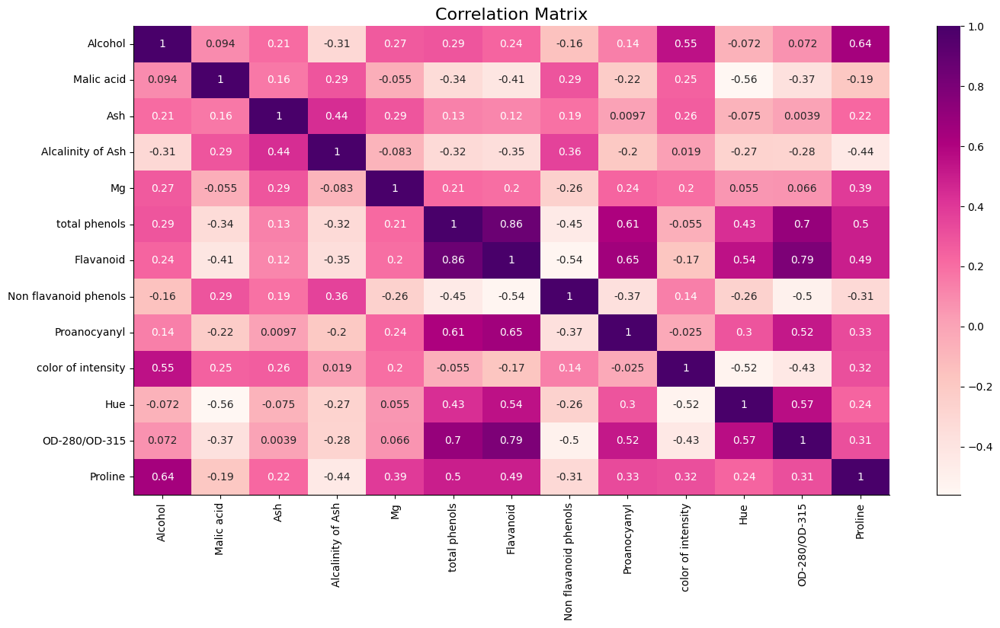

In [ ]:
# Correlation matrix tính hệ số tương quan
corr_matrix = df[['Alcohol', 'Malic acid','Ash','Alcalinity of Ash','Mg','total phenols'
                                             ,'Flavanoid','Non flavanoid phenols','Proanocyanyl','color of intensity','Hue',
                                             'OD-280/OD-315','Proline']].corr()
plt.figure(figsize=(16, 8))
sns.heatmap(corr_matrix, annot=True, cmap='RdPu', annot_kws={'size': 10})
plt.title('Correlation Matrix', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=10)
sns.despine()
plt.show()

Biểu đồ scatter cho thấy mối tương quan mạnh mẽ giữa một số attributes. Nếu chỉ số tương quan quá lớn, phân tích sẽ sử dụng 1 trong 2 feature để đại diện cho cả 2 attribute

1.   tương quan thuận giữa total phenol và flavoind(0.86)
2.   OD280-OD315 vs flavanoid (0.79)
3.   Proanthocyadins vs flavanoid (0.65)
4.   Alcohol vs Proline (0.64)


Tập dữ liệu này chứa các đặc điểm số được đo bằng các đơn vị khác nhau. Một thuật toán ML sẽ coi feature Alcohol quan trọng hơn Ash chỉ vì các giá trị của Alcohol lớn hơn và có độ biến thiên cao hơn. Các thuật toán ML cần xem xét tất cả các tính năng trên một sân chơi bình đẳng. Điều đó có nghĩa là các giá trị cho tất cả các tính năng phải được chuyển đổi thành cùng một tỷ lệ.  Đây là bước tiền xử lý dữ liệu quan trọng đối với hầu hết các thuật toán học máy dựa trên khoảng cách như KNN vì nó có thể tác động đáng kể đến hiệu suất thuật toán.
Ở đây sử dụng Standard Scaler

In [ ]:
# Scale data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X= df[['Alcohol', 'Malic acid','Ash','Alcalinity of Ash','Mg','Flavanoid','Non flavanoid phenols','Proanocyanyl','color of intensity','Hue','OD-280/OD-315','Proline']]
scaled_features = scaler.fit_transform(X) # Transform data để phù hợp với đầu vào của các hàm tính toán dưới đây
X=scaled_features

In [ ]:
#Phân tách dữ liệu thành các tập train và test
from sklearn.model_selection import train_test_split
y = df["Class"].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random state= 1)

Xử lý mất cân bằng dữ liệu

In [ ]:
pip install imbalanced-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Đếm số dữ liệu trong mỗi class trong tập Train
from collections import Counter
counter = Counter(y_train)
for k,v in counter.items():
 per = v / len(y) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))

Class=1, n=43 (24.157%)
Class=3, n=35 (19.663%)
Class=2, n=46 (25.843%)


In [ ]:
# Tăng size dữ liệu của 2 class có số lượng sample ít hơn sử dụng Oversampling SMOTE
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X_train, y_train = oversample.fit_resample(X_train, y_train)
# Đếm số dữ liệu trong mỗi class trong tập Train sau khi oversampling
counter = Counter(y_train)
for k,v in counter.items():
 per = v / len(y_train) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))

Class=1, n=46 (33.333%)
Class=3, n=46 (33.333%)
Class=2, n=46 (33.333%)


In [ ]:
# Kiểm tra K có độ chính xác tốt nhất
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (confusion_matrix,precision_score,recall_score,f1_score)
f1=[]
rec=[]
Prec=[] #Tạo list rỗng chứa giá trị của các metrics
for k in range (2,12):
  knn = KNeighborsClassifier(n_neighbors= k)
  knn.fit(X_train, y_train)
  y_pred = knn.predict(X_test)
  f1.append(f1_score(y_test,  y_pred, average='weighted'))
  rec.append(recall_score(y_test,  y_pred, average='weighted'))
  Prec.append(precision_score(y_test, y_pred, average='weighted'))

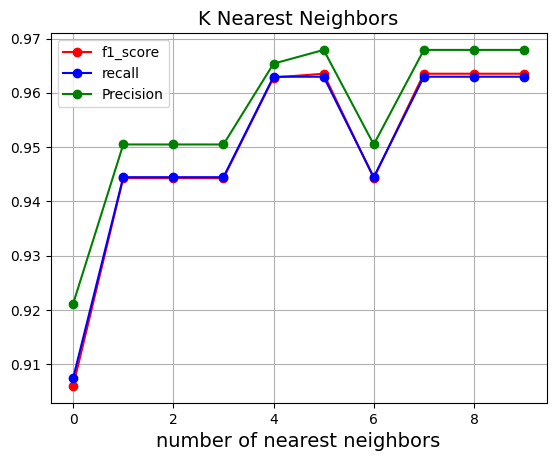

In [ ]:
import matplotlib.pyplot as plt
plt.plot(f1,  color='red', marker='o',label='f1_score')
plt.plot(rec, color='Blue', marker='o',label='recall')
plt.plot(Prec, color='green', marker='o',label='Precision')
plt.title('K Nearest Neighbors', fontsize=14)
plt.xlabel('number of nearest neighbors', fontsize=14)
plt.grid(True)
plt.legend()
plt.show()

Như vậy k=5,7,9 có độ chính xác, f1 và recall tốt nhất. Tuy nhiên, xét về input dataset có nhiều điểm ouliers nên trong phân tích này sẽ lựa chọn k không quá nhỏ
 > Kết luận: Chọn k=9


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
model_knn = KNeighborsClassifier(n_neighbors=9)
model_knn.fit(X,y)#Training
y_pred = model_knn.predict(X_test)
print ('F1 score:', f1_score(y_test,  y_pred, average='weighted'))
print ('Recall:', recall_score(y_test,  y_pred, average='weighted'))
print ('Precision:', precision_score(y_test, y_pred, average='weighted'))

F1 score: 0.9635141093474426
Recall: 0.9629629629629629
Precision: 0.9679012345679012


In [ ]:
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm,
                     index = ['wine 1','wine 2','wine 3'],
                     columns = ['wine 1','wine 2','wine 3'])

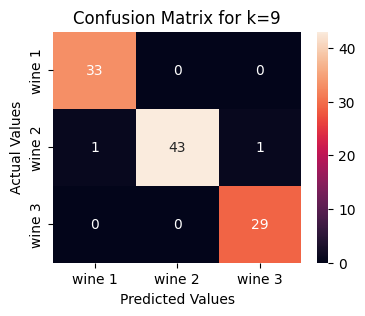

In [ ]:
#confusion matrix
plt.figure(figsize=(4,3))
sns.heatmap(cm_df,annot=True)
plt.title('Confusion Matrix for k=9')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

In [ ]:
#Phân tách dữ liệu thành các tập train và test
from sklearn.model_selection import train_test_split
y = df["Class"].values
Xtree_train, Xtree_test, ytree_train, ytree_test = train_test_split(X, y, test_size=0.4)

In [ ]:
#Training mô hình Decision Tree
from sklearn import tree
model_tree = tree.DecisionTreeClassifier()
model_tree.fit(Xtree_train, ytree_train) #Training mô hình
ytree_pred=model_tree.predict(Xtree_test)

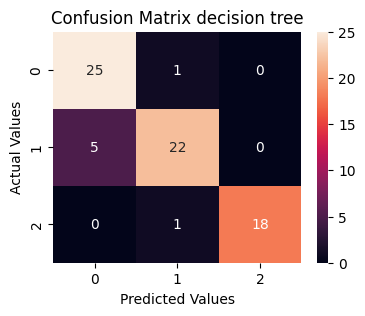

In [ ]:
import seaborn as sns
from sklearn import metrics

cnf_tree = metrics.confusion_matrix(ytree_test, ytree_pred)
plt.figure(figsize=(4,3))
sns.heatmap(cnf_tree,annot=True)
plt.title('Confusion Matrix decision tree')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

In [ ]:
print ('F1 score:', f1_score(ytree_test,  ytree_pred, average='weighted'))
print ('Recall:', recall_score(ytree_test,  ytree_pred, average='weighted'))
print ('Precision:', precision_score(ytree_test, ytree_pred, average='weighted'))

F1 score: 0.9027068034420975
Recall: 0.9027777777777778
Precision: 0.9085648148148149


Mô hình KNN trả về kết quả tốt hơn mô hình Decision Tree với trường hợp dữ liệu được xử lý tốt.
Khi xử lý mà không scale data, mô hình Decision Tree lại cho kết quả tốt hơn và cũng đồng đều hơn giữa 3 class. Như vậy, bước scale dữ liệu đã giúp cải thiện hiệu suất của mô hình KNN một cách đáng kể (độ chính xác tăng từ 0.74 lên đến 0.98) :

> 1.Các bước tiền xử lý dữ liệu ảnh hưởng trực tiếp đến độ chính xác của model
> 2. Mô hình KNN có sự nhạy cảm hơn với việc co giãn dữ liệu (Scaling) so với mô hình Decision Tree

## 4 Extra: Predict Cooling & Heating Loads

Nghiên cứu này xem xét việc đánh giá các yêu cầu về tải nhiệt và tải làm mát của các tòa nhà

 Các tòa nhà khác nhau về diện tích lắp kính, phân bố diện tích lắp kính và hướng, và các thông số khác. Bộ dữ liệu bao gồm 768 mẫu và 8 tính năng, nhằm mục đích dự đoán hai phản hồi là cooling và heating loads. Nó cũng có thể được sử dụng như một bài toán phân loại nhiều lớp nếu phản hồi được làm tròn đến số nguyên gần nhất.

In [ ]:
xtra = pd.read_excel('/content/ENB2012_data.xlsx')
xtra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X1      768 non-null    float64
 1   X2      768 non-null    float64
 2   X3      768 non-null    float64
 3   X4      768 non-null    float64
 4   X5      768 non-null    float64
 5   X6      768 non-null    int64  
 6   X7      768 non-null    float64
 7   X8      768 non-null    int64  
 8   Y1      768 non-null    float64
 9   Y2      768 non-null    float64
dtypes: float64(8), int64(2)
memory usage: 60.1 KB


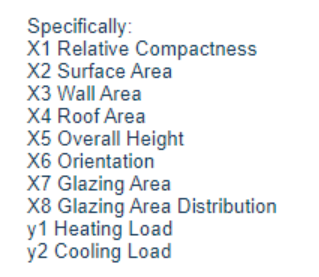

In [ ]:
xtra.sample(10)

,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
310,0.76,661.5,416.5,122.5,7.0,4,0.25,1,36.91,37.45
568,0.64,784.0,343.0,220.5,3.5,2,0.40,1,19.52,22.72
685,0.82,612.5,318.5,147.0,7.0,3,0.40,4,28.05,32.35
43,0.64,784.0,343.0,220.5,3.5,5,0.00,0,10.56,16.67
397,0.82,612.5,318.5,147.0,7.0,3,0.25,3,25.48,27.76
402,0.79,637.0,343.0,147.0,7.0,4,0.25,3,39.81,37.76
678,0.90,563.5,318.5,122.5,7.0,4,0.40,4,35.40,39.22
139,0.64,784.0,343.0,220.5,3.5,5,0.10,2,15.19,19.30
629,0.90,563.5,318.5,122.5,7.0,3,0.40,3,34.95,35.04
324,0.66,759.5,318.5,220.5,3.5,2,0.25,1,13.17,16.39


In [ ]:
from pandas_profiling import ProfileReport
profile_build = ProfileReport(xtra, title="Profiling Report for Bulding cooling & heating loads")
profile_build

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


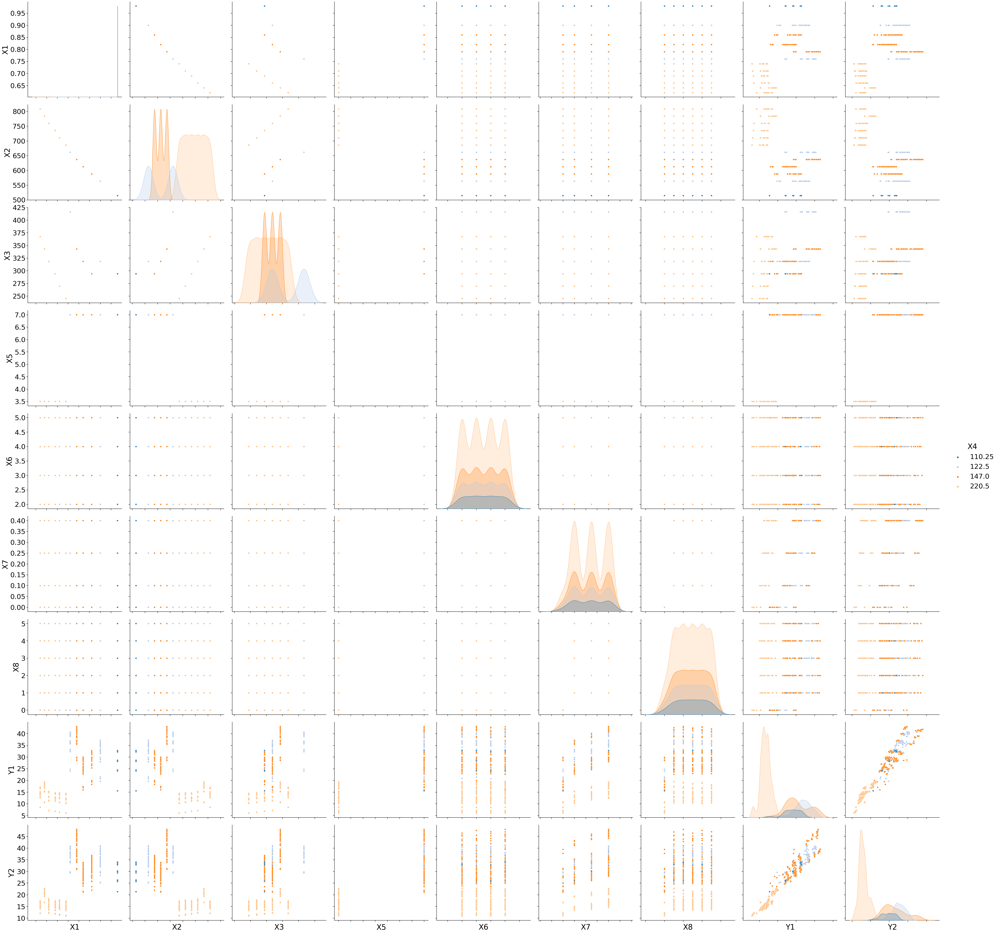

In [ ]:
#understanding the distribution with seaborn
with sns.plotting_context("notebook",font_scale=2.5):
    g = sns.pairplot(xtra[['X1','X2','X4','X3','X5','X6','X7','X8','Y1','Y2']],
                 hue='X4', palette='tab20',size=6)
g.set(xticklabels=[]);

In [ ]:
# Kiểm tra xem còn cột nào chứa giá trị Nan hay không
np.any(np.isnan(xtra))

False

<Axes: xlabel='Y1', ylabel='Y2'>

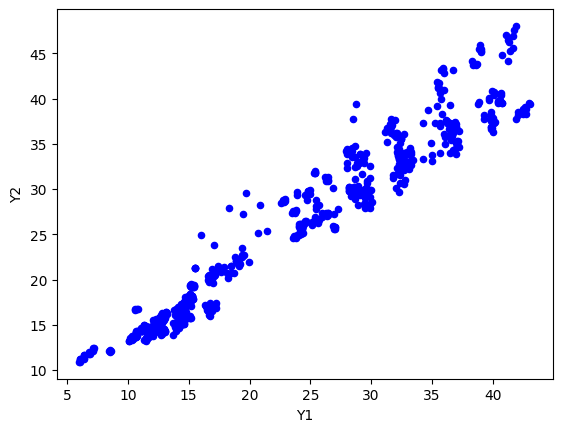

In [ ]:
import pandas as pd
import numpy as np
ax3 = xtra.plot(kind='scatter', x='Y1', y='Y2', color='b')
ax3

In [ ]:
# Normalize data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X= xtra[['X1','X2','X3','X8']] # chỉ scale numerical columns
scaled_features = scaler.fit_transform(X) # Transform data để phù hợp với đầu vào của các hàm tính toán dưới đây
scaled_features

array([[1.        , 0.        , 0.28571429, 0.        ],
       [1.        , 0.        , 0.28571429, 0.        ],
       [1.        , 0.        , 0.28571429, 0.        ],
       ...,
       [0.        , 1.        , 0.71428571, 1.        ],
       [0.        , 1.        , 0.71428571, 1.        ],
       [0.        , 1.        , 0.71428571, 1.        ]])

In [ ]:
categ_features= xtra[['X4',	'X5',	'X6','X7']].values
categ_features

array([[110.25,   7.  ,   2.  ,   0.  ],
       [110.25,   7.  ,   3.  ,   0.  ],
       [110.25,   7.  ,   4.  ,   0.  ],
       ...,
       [220.5 ,   3.5 ,   3.  ,   0.4 ],
       [220.5 ,   3.5 ,   4.  ,   0.4 ],
       [220.5 ,   3.5 ,   5.  ,   0.4 ]])

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
x_values = np.concatenate((scaled_features,categ_features), axis=1)
y1_values = xtra[['Y1']].values

#define our polynomial model, with whatever degree we want
degree=2

# PolynomialFeatures will create a new matrix consisting of all polynomial combinations
# of the features with a degree less than or equal to the degree we just gave the model (2)
poly_model = PolynomialFeatures(degree=degree)

# transform out polynomial features
poly_x_values = poly_model.fit_transform(x_values)


Text(0.5, 1.0, 'MSE & R2 of Heating regression by degree')

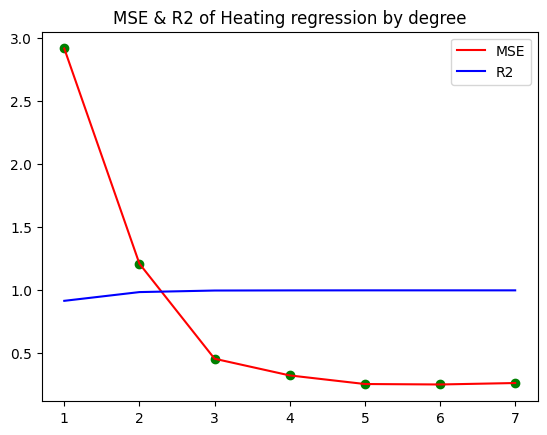

In [ ]:
 from sklearn.linear_model import LinearRegression
 from sklearn.metrics import (mean_squared_error,r2_score)
 #Kiểm tra độ chính xác của từng mô hình regression với từng bậc (degree)
number_degrees = [1,2,3,4,5,6,7]
plt_mean_squared_error = []
plt_r2 =[]
for degree in number_degrees:

   poly_model = PolynomialFeatures(degree=degree)

   poly_x_values = poly_model.fit_transform(x_values)
   poly_model.fit(poly_x_values, y1_values)

   regression_model = LinearRegression()
   regression_model.fit(poly_x_values, y1_values)
   y1_pred = regression_model.predict(poly_x_values)

   plt_mean_squared_error.append(mean_squared_error(y1_values, y1_pred, squared=False))
   plt_r2.append(r2_score(y1_values, y1_pred))
plt.scatter(number_degrees,plt_mean_squared_error, color="green")
plt.plot(number_degrees,plt_mean_squared_error, color="red", label="MSE")
plt.plot(number_degrees,plt_r2, color="blue", label="R2")
plt.legend()
plt.title("MSE & R2 of Heating regression by degree")

MSE càng nhỏ thì mô hình càng hoàn hảo. Ở đây ta thấy bậc 5,6,7 có MSE gần giá trị 0, R tiệm cận 1 nhất, tuy nhiên nếu bậc của hàm quá cao có thể dẫn đến Overfitting!
>Trong phân tích này chọn degree=3 có thể là phương án an toàn hơn.

In [ ]:
degree=3

# PolynomialFeatures will create a new matrix consisting of all polynomial combinations
# of the features with a degree less than or equal to the degree we just gave the model (2)
poly_model = PolynomialFeatures(degree=degree)

# transform out polynomial features
poly_x_values = poly_model.fit_transform(x_values)
poly_model.fit(poly_x_values, y1_values)

regression_model = LinearRegression()# Bản chất Polinominal Regression là Linear Regresion với degree > 1
regression_model.fit(poly_x_values, y1_values)

y_pred = regression_model.predict(poly_x_values)

print("R2 =",r2_score(y1_values, y_pred))
print("MSE =",mean_squared_error(y1_values, y_pred, squared=False))


R2 = 0.997949762086322
MSE = 0.45658238000163326


Text(0.5, 1.0, 'MSE & R2 of Cooling regression by degree')

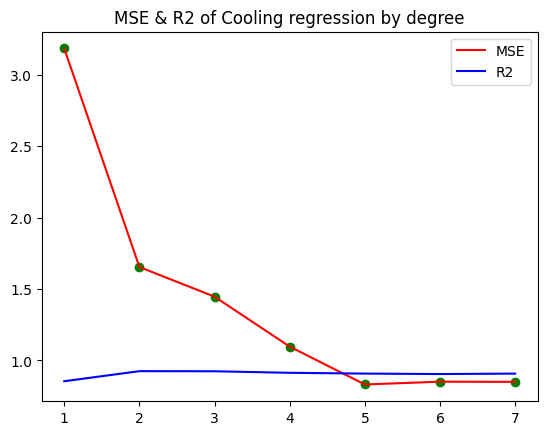

In [ ]:
# Kiểm tra MSE và R2 khi áp dụng Polynominal Regression các bậc khác nhau với gia tri phu thuoc Cooling Load
y2_values = xtra['Y2'].values
number_degrees = [1,2,3,4,5,6,7]
plt_mean_squared_error = []
plt_r2 =[]
for degree in number_degrees:

   poly_model = PolynomialFeatures(degree=degree)

   poly_x_values = poly_model.fit_transform(x_values)
   poly_model.fit(poly_x_values, y2_values)

   regression_model = LinearRegression()
   regression_model.fit(poly_x_values, y2_values)
   y2_pred = regression_model.predict(poly_x_values)

   plt_mean_squared_error.append(mean_squared_error(y2_values, y2_pred, squared=False))
   plt_r2.append(r2_score(y1_values, y2_pred))
plt.scatter(number_degrees,plt_mean_squared_error, color="green")
plt.plot(number_degrees,plt_mean_squared_error, color="red", label="MSE")
plt.plot(number_degrees,plt_r2, color="blue", label="R2")
plt.legend()
plt.title("MSE & R2 of Cooling regression by degree")

In [ ]:
degree=5
poly_model = PolynomialFeatures(degree=degree)
# transform out polynomial features
poly_x_values = poly_model.fit_transform(x_values)
poly_model.fit(poly_x_values, y2_values)

regression_model = LinearRegression()
regression_model.fit(poly_x_values, y2_values)

y_pred = regression_model.predict(poly_x_values)

print("R2 =",r2_score(y1_values, y_pred))
print("MSE =",mean_squared_error(y2_values, y_pred, squared=False))


R2 = 0.9080152306996031
MSE = 0.8318163102612219


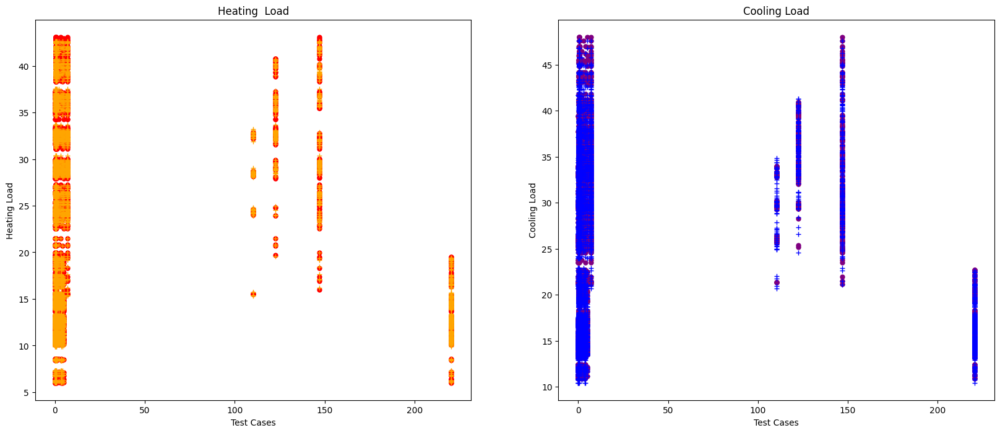

<Figure size 2000x1000 with 0 Axes>

In [ ]:

fig, ax = plt.subplots(1, 2, figsize=(20,8))

#Visualize the heating load output

ax[0].plot(x_values,y1_values,'o',color='red',label = 'Actual Values',linewidth=0.2, markersize=5)
ax[0].plot(x_values,y1_pred,'+',color='orange',label = 'Predicted Values',linewidth=0.2, markersize=6)
ax[0].set_xlabel('Test Cases')
ax[0].set_ylabel('Heating Load')
ax[0].set_title('Heating  Load')


#Visualize the cooling load output
plt.figure(figsize = (20,10))
ax[1].plot(x_values,y2_values,'o',color='purple',label = 'Actual Values',linewidth=0.2, markersize=5)
ax[1].plot(x_values,y2_pred,'+',color='blue',label = 'Predicted Values',linewidth=0.2, markersize=6)
ax[1].set_xlabel('Test Cases')
ax[1].set_ylabel('Cooling Load')
ax[1].set_title('Cooling Load')


plt.show()